In [1]:
using Revise
using Plots, OrdinaryDiffEq

push!(LOAD_PATH, "../src")

using Pendulum, SymReg

[ Info: Precompiling Pendulum [top-level]
[ Info: Precompiling SymReg [top-level]


## Generate data

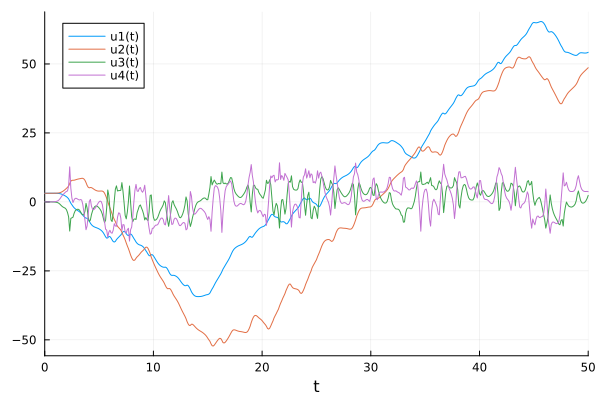

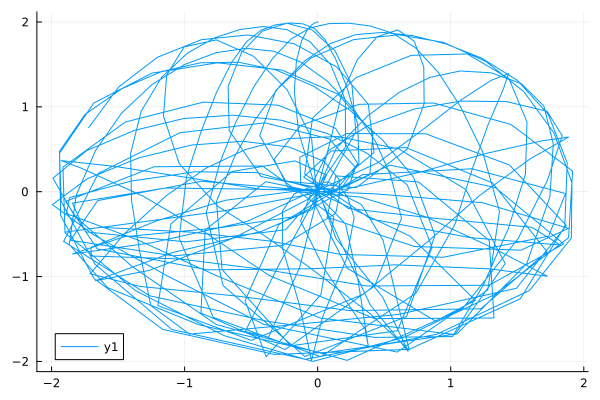

In [2]:
m1 = 1 #units of kg
m2 = 1 
l1 = 1 #units of m
l2 = 1
g = 10 #units of kg*m/s^2

pendulum = DoublePendulum([m1, m2, l1, l2, g])

x0 = [3.141f0, 3.141f0, 0, 0] 

t_transient = 0f0
N_t = 500
dt = 0.1f0

times = t_transient:dt:t_transient + N_t * dt

sol = trajectory(pendulum, x0, N_t, dt, t_transient)
display(plot(sol))
plot_trajectory(pendulum, sol)

[ Info: Saved animation to c:\Users\Simon\Documents\PIK\Code\ode_test.jl\images\pendulum.gif


Plots.AnimatedGif("c:\\Users\\Simon\\Documents\\PIK\\Code\\ode_test.jl\\images\\pendulum.gif")
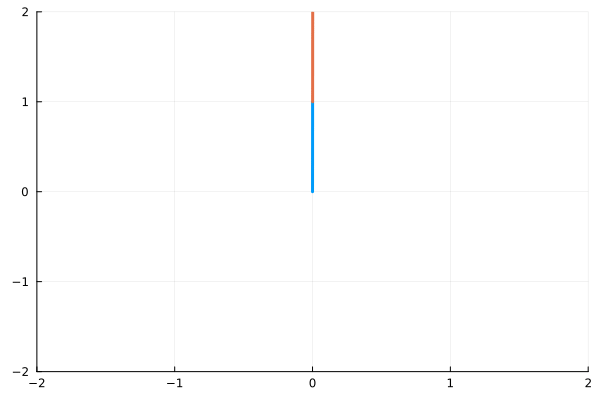

In [ ]:
create_animation(pendulum, sol)

## Fitting SINDy model

In [3]:
sindy = SINDy(sol)

SINDy{DataDrivenDiffEq.DataDrivenProblem{Float32, false, DataDrivenDiffEq.Continuous}, DataDrivenDiffEq.DataDrivenSolution{Float32}}(Continuous DataDrivenProblem{Float32} ##DDProblem#373 in 4 dimensions and 501 samples, "DataDrivenSolution{Float32}")

### Results

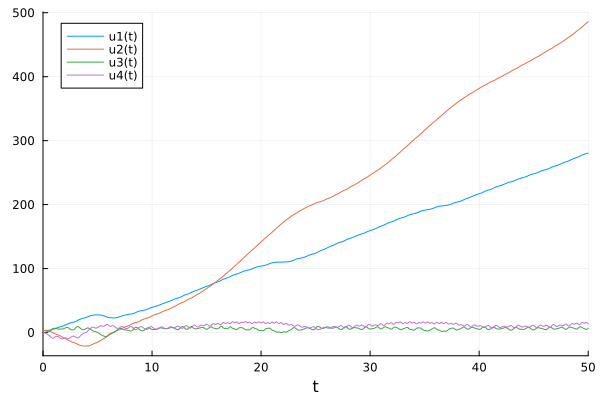

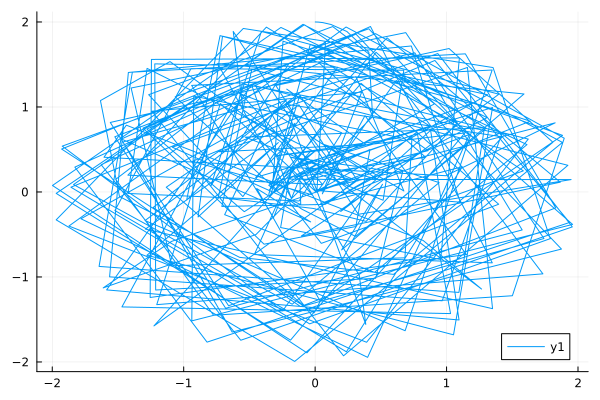

In [4]:
sindy_prob = ODEProblem(sindy,x0, (0f0, Float32(t_transient + N_t * dt)), sindy.sol.prob.p)
sol_sindy = solve(sindy_prob, Tsit5())
display(plot(sol_sindy))
plot_trajectory(pendulum, sol_sindy)

[ Info: Saved animation to c:\Users\Simon\Documents\PIK\Code\ode_test.jl\images\pendulum.gif


Plots.AnimatedGif("c:\\Users\\Simon\\Documents\\PIK\\Code\\ode_test.jl\\images\\pendulum.gif")
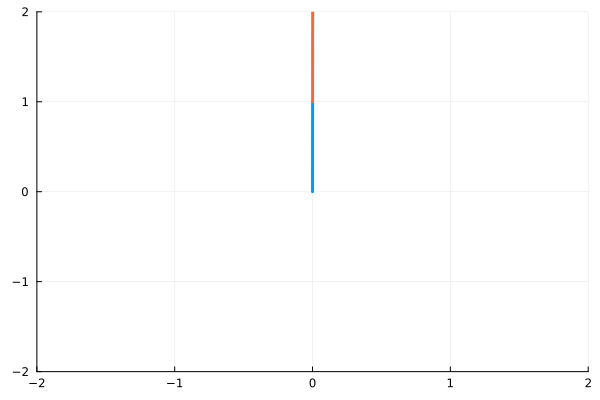

In [9]:
create_animation(pendulum, sol_sindy)

## Genetic Symbolc Regressiion

In [38]:
gsr = GeneticSymReg(sol, times);

┌ Warning: You are using multithreading mode, but only one thread is available. Try starting julia with `--threads=auto`.
└ @ SymbolicRegression C:\Users\Simon\.julia\packages\SymbolicRegression\5YJIk\src\SymbolicRegression.jl:411


Started!

Cycles per second: 2.570e+04
Head worker occupation: 4.6%
Progress: 71 / 800 total iterations (8.875%)
Best equations for output 1
Hall of Fame:
-----------------------------------------
Complexity  Loss       Score     Equation
1           1.066e-01  5.246e+00  x3
3           1.062e-01  1.763e-03  (x3 * 0.9958049)

Best equations for output 2
Hall of Fame:
-----------------------------------------
Complexity  Loss       Score     Equation
1           1.849e-01  5.285e+00  x4
3           1.845e-01  1.153e-03  (x4 * 0.9966259)
5           1.845e-01  5.242e-05  ((x4 + 0.0044590877) * 0.99651784)

Best equations for output 3
Hall of Fame:
-----------------------------------------
Complexity  Loss       Score     Equation
1           4.667e+02  -1.000e-10  0.060905054
2           4.609e+02  1.249e-02  sin(x2)
4           4.471e+02  1.526e-02  (sin(x2) / 0.17495672)
5           4.471e+02  3.713e-05  (sin(x2) / sin(0.17495672))
6           3.977e+02  1.171e-01  (sin(x2 - x1) / 0.22

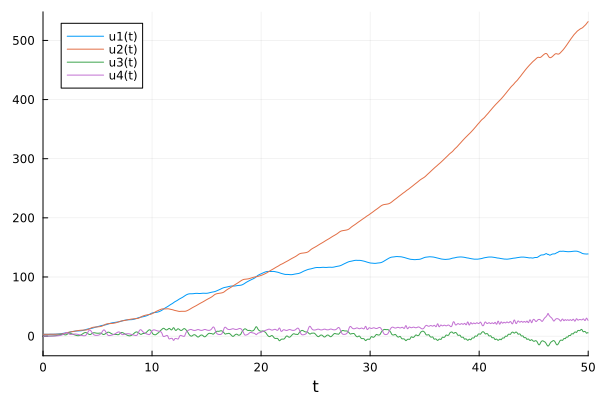

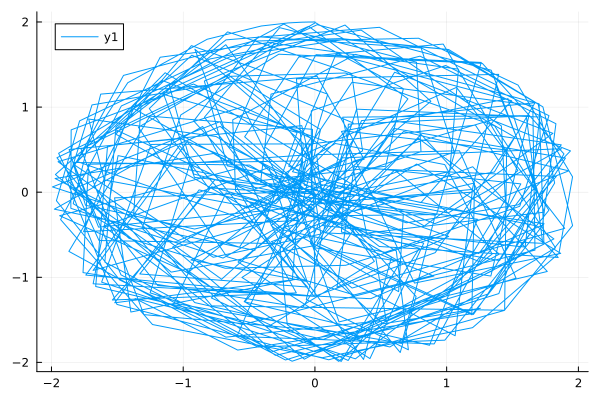

In [39]:
gsr_prob = ODEProblem((u,p,t) -> vec(gsr(hcat(u))),x0,(0f0, Float32(t_transient + N_t * dt)))
sol_gsr = solve(gsr_prob, Tsit5())
display(plot(sol_gsr))
plot_trajectory(pendulum, sol_gsr)

[ Info: Saved animation to c:\Users\Simon\Documents\PIK\Code\ode_test.jl\images\pendulum.gif


Plots.AnimatedGif("c:\\Users\\Simon\\Documents\\PIK\\Code\\ode_test.jl\\images\\pendulum.gif")
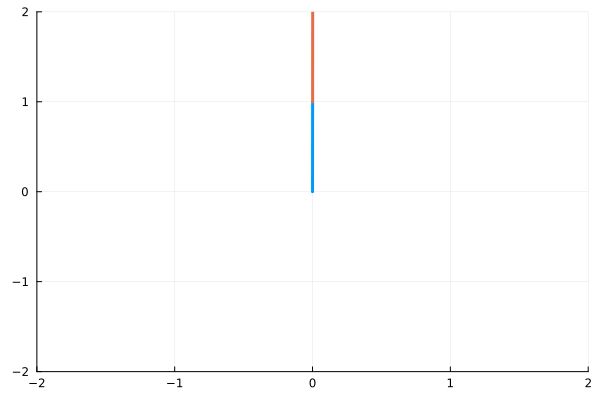

In [50]:
create_animation(pendulum, sol_gsr)

## NODE + SymbolicRegression on Double Pendulum

In [15]:
using NeuralODE

[ Info: Precompiling NeuralODE [top-level]


In [18]:
#using Flux
train_data = generate_train_data(pendulum, 3, x0; N_t=N_t, dt=dt, t_transient=t_transient)

#p, re_nn = NODE_ANN(4,4,16,4)
#p, re_nn = Flux.destructure(Chain(x->sindy(x), Dense(4,16, relu), Dense(16,16, relu), Dense(16,16, relu), Dense(16,4,)))
node(u, p, t) = re_nn(p)(u)
#node(u, p, t) = re_nn(p)(sindy(u))
#node(u,p,t) = re_nn(p)(vec(gsr(hcat(u))))
node_prob = ODEProblem(node, x0, (Float32(0.),Float32(dt)), p)

model = NODE(node_prob)

NODE{Vector{Float32}, ODEProblem{false,Vector{Float32},Tuple{Float32, Float32},…}, Tsit5{Static.False,…}, Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}}(Float32[-0.17767295, 0.2537395, -0.17800145, 0.15953791, 0.53166527, 0.11804936, 0.01078742, 0.4235234, 0.50224453, -0.069446295  …  0.12232805, -0.46984956, -0.46989655, -0.41205177, -0.5385863, -0.19778188, 0.0, 0.0, 0.0, 0.0], ODEProblem{false,Vector{Float32},Tuple{Float32, Float32},…}(ODEFunction{false,SciMLBase.AutoSpecialize,…}(node, LinearAlgebra.UniformScaling{Bool}(true), nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, nothing, SciMLBase.DEFAULT_OBSERVED, nothing, nothing), Float32[3.141, 3.141, 0.0, 0.0], (0.0f0, 0.1f0), Float32[-0.17767295, 0.2537395, -0.17800145, 0.15953791, 0.53166527, 0.11804936, 0.01078742, 0.4235234, 0.50224453, -0.069446295  …  0.12232805, -0.46984956, -0.46989655, -0.41205177, -0.5385863, -0.19778188, 0.0, 0.0, 0.0, 0.0], Base

In [69]:
using BenchmarkTools, Suppressor

u = [1f0,1f0,1f0,1f0]

#Speed test for single evaluation
@btime re_nn(p)(u)
@btime re_nn(p)(sindy(u))
@suppress_err begin
@btime re_nn(p)(vec(gsr(hcat(u))))
end

  20.200 μs (122 allocations: 8.22 KiB)
  20.800 μs (124 allocations: 8.38 KiB)
  30.800 μs (194 allocations: 13.03 KiB)


4-element Vector{Float32}:
  1.1031475
 -0.9469055
 -1.0309154
  0.68051076

In [45]:
using BenchmarkTools, Suppressor

loss = Flux.Losses.mse

p, re_nn = NODE_ANN(4,4,4,1)

node(u, p, t) = re_nn(p)(u)
node_prob = ODEProblem(node, x0, (Float32(0.),Float32(dt)), p)
model = NODE(node_prob)
@btime g = Flux.withgradient(model) do m 
            result = m((Array(times)[1:2], train_data.data[:,1:2]))
            loss(result, train_data.data[:,1:2])
      end

node(u, p, t) = re_nn(p)(sindy(u))
node_prob = ODEProblem(node, x0, (Float32(0.),Float32(dt)), p)
model = NODE(node_prob)
@btime g = Flux.withgradient(model) do m 
            result = m((Array(times)[1:2], train_data.data[:,1:2]))
            loss(result, train_data.data[:,1:2])
      end

node(u,p,t) = re_nn(p)(vec(gsr(hcat(u))))
node_prob = ODEProblem(node, x0, (Float32(0.),Float32(dt)), p)
model = NODE(node_prob)
@suppress_err begin
@btime g = Flux.withgradient(model) do m 
            result = m((Array(times)[1:2], train_data.data[:,1:2]))
            loss(result, train_data.data[:,1:2])
      end
end

  1.981 ms (10607 allocations: 885.58 KiB)
  2.677 ms (14670 allocations: 1.20 MiB)
  53.750 ms (85703 allocations: 5.92 MiB)


(val = 7.0089365f-5, grad = ((p = Float32[-2.53816f-6, 3.175682f-6, 2.2740244f-6, -4.273754f-7, 7.847964f-6, -9.447458f-6, -5.2283185f-6, 8.6141574f-7, -5.744308f-5, 7.121657f-5, 4.7663427f-5, -8.699875f-6, 0.00014744751, -0.00017867172, -0.00010392605, 1.7637762f-5, 0.000564218, -0.00067631295, -0.00036534003, 5.9253587f-5], prob = nothing, alg = nothing, kwargs = nothing),))

Begin training


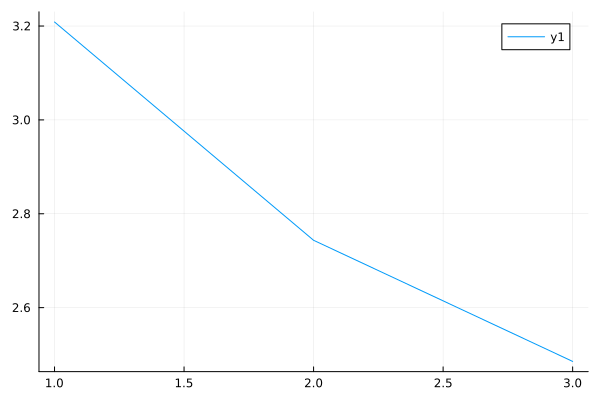

In [19]:
loss_log = train_NODE(model, train_data, 3, η=1f-3)
plot(loss_log)

┌ Warning: Instability detected. Aborting
└ @ SciMLBase C:\Users\Simon\.julia\packages\SciMLBase\zXEYU\src\integrator_interface.jl:536


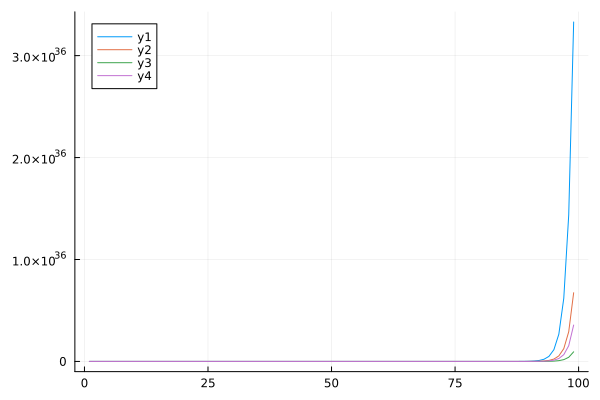

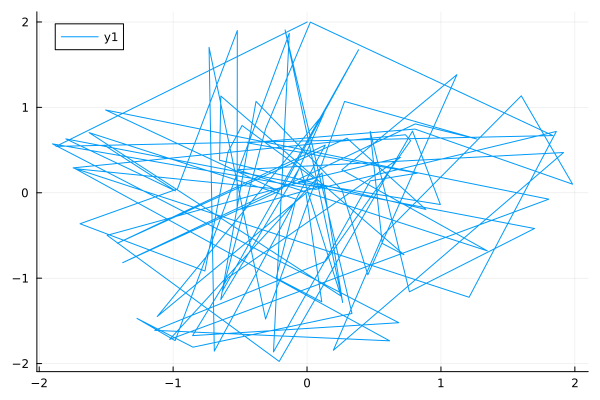

In [31]:
#Test model
t = convert(Array{Float32,1}, collect(0:0.1:50))
rec_sol = model((t,x0))
display(plot(transpose(Array(rec_sol))))
plot(sin.(rec_sol[1,:])*l1 + sin.(rec_sol[2,:])*l2, -cos.(rec_sol[1,:])*l1 - cos.(rec_sol[2,:])*l2)

In [117]:
save_ANN(re_nn(model.p), "../models/pendulum_sindy_model.bson")

┌ Error: Failed to revise c:\Users\Simon\Documents\PIK\Code\ode_test.jl\src\SymReg.jl
│   exception =
│    invalid redefinition of constant GeneticSymReg
│    Stacktrace:
│     [1] top-level scope
│       @ c:\Users\Simon\Documents\PIK\Code\ode_test.jl\src\SymReg.jl:45
│    Revise evaluation error at c:\Users\Simon\Documents\PIK\Code\ode_test.jl\src\SymReg.jl:45
│    
└ @ Revise C:\Users\Simon\.julia\packages\Revise\P8ITN\src\packagedef.jl:715


[ Info: Saved animation to c:\Users\Simon\Documents\PIK\Code\ode_test.jl\images\pendulum.gif


Plots.AnimatedGif("c:\\Users\\Simon\\Documents\\PIK\\Code\\ode_test.jl\\images\\pendulum.gif")
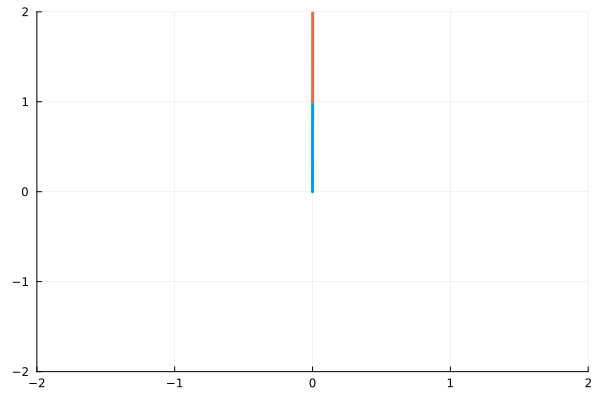

In [13]:
create_animation(pendulum, rec_sol)